# VocV1 (Vocoder)

A fast high-fidelity source-filter vocoder with lightweight neural modules.
The provided pretrained models work under 44.1 kHz only.

This page contains demo code for audio analysis (extraction of acoustic features) and synthesis.
The entire vocoding pipeline involves 2 neural network models - one for separation between
harmonics & breathiness components during analysis, and another for generating aperiodic excitation
for synthesizing breathiness component. 

This repo only contains inference part of these 2 models. Attempts on merging their training code 
into this repo have been extremely painful, as they were trained separately on 2 different platforms 
(TensorFlow and PyTorch) with dependencies of conflicting versions. Training details have been provided 
in paper. In case of explicit request for training part of these models, I'll set them up into separate repos.


# Setup

In [1]:
# cd to parent directory (root directory of the project)
%cd ..

d:\Git\VogenSVS


In [2]:
import os
import pathlib
import numpy as np
import soundfile as sf
import torch
import pydub
import vogensvs.vocv1 as vocv1
import vogensvs.vocv1.vocv1numpyonnx as vocv1no
import vogensvs.vocv1.vocv1torch as vocv1pt
import matplotlib.pyplot as plt
import IPython.display as ipd

analyzer = vocv1no.Analyzer()

np.set_printoptions(suppress=True, precision=4, linewidth=128)


# Analysis

In [3]:
# load audio
audio = pydub.AudioSegment.from_file(pathlib.Path('docs/VocoderV01/AudioDemo/0 DA SXQN 004+7.m4a'))
x = np.array(audio.get_array_of_samples()).astype(np.float32) / 32768

# ensure 44.1 kHz
x, fs = vocv1.ensureFs(x, audio.frame_rate)

# preview audio
ipd.Audio(x, rate=fs)

In [4]:
# more info about audio
specMaxFrames = len(x) // vocv1.hopSamples + 1
specMaxSec = specMaxFrames * vocv1.hopSamples / fs
specMaxFreq = (vocv1no.fftSize // 2 + 1) / vocv1no.fftSize * fs
specViewport = (0, specMaxSec, 0, specMaxFreq)

print(f'Number of frames: {specMaxFrames}')
print(f'Duration in seconds: {specMaxSec}')
print(f'Spectrogram max frequency: {specMaxFreq}')
print(f'Spectrogram viewport: {specViewport}')

Number of frames: 644
Duration in seconds: 6.44
Spectrogram max frequency: 22071.533203125
Spectrogram viewport: (0, 6.44, 0, 22071.533203125)


xLF.shape = (644, 1025)


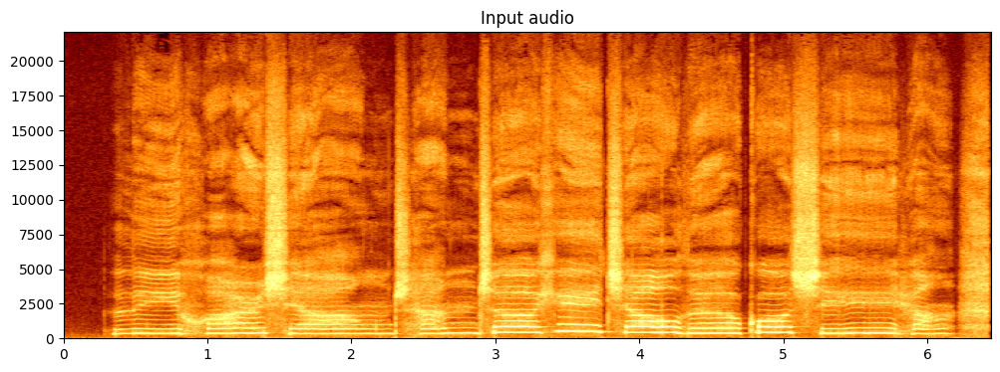

In [5]:
# plot audio spectrogram
xFc = vocv1no.stft(x, vocv1no.fftSize, vocv1.hopSamples)
xF = np.abs(xFc)
xLF = np.log(np.maximum(xF, 1e-5))
print(f'{xLF.shape = }')

_ = plt.figure(figsize=(12, 4))
_ = plt.imshow(xLF.T, 'afmhot', origin='lower', aspect='auto', vmin=-10, vmax=5, extent=specViewport)
_ = plt.title(f'Input audio',)
plt.show()

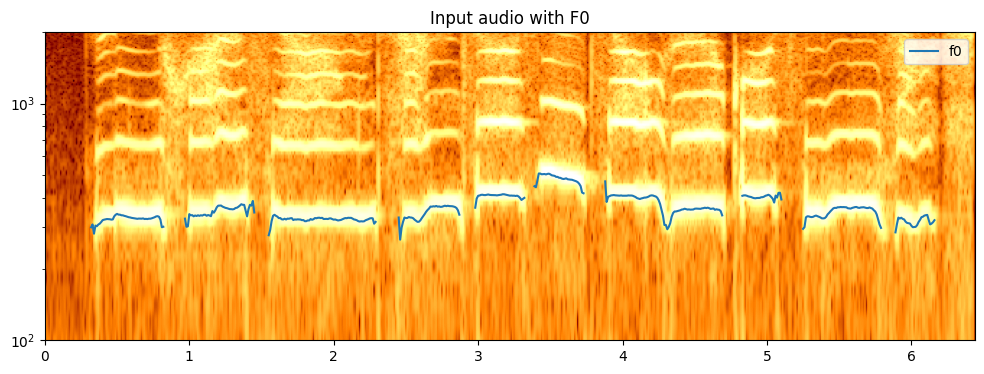

In [6]:
# plot audio spectrogram with f0
f0, t = vocv1no.f0Extract(x.astype(np.float64), fs)

_ = plt.figure(figsize=(12, 4))
_ = plt.imshow(xLF[:, :-1].T, 'afmhot', origin='lower', aspect='auto', vmin=-10, vmax=5, extent=specViewport)
_ = plt.plot(np.arange(specMaxFrames) * vocv1.hopSamples / fs, np.where(f0 > 0, f0, np.nan), label='f0')
_ = plt.yscale('log')
_ = plt.ylim(100, 2000)
_ = plt.legend()
_ = plt.title(f'Input audio with F0',)
plt.show()

xH.shape = (644, 1025)
xN.shape = (644, 442)


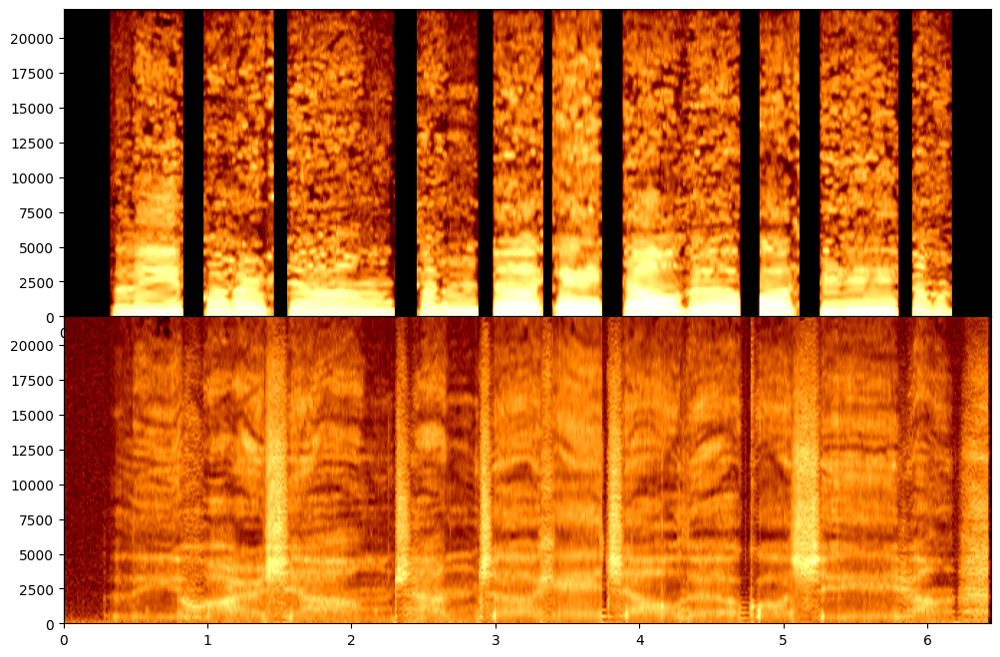

In [7]:
# plot acoustic features (uncompressed)
xH, xN = analyzer.analyze(x, f0, t)
print(f'{xH.shape = }')
print(f'{xN.shape = }')

_ = plt.figure(figsize=(12, 8))
_ = plt.subplots_adjust(hspace=0)
_ = plt.subplot(2, 1, 1)
_ = plt.imshow(np.log(np.maximum(xH, 1e-5))[:, :-1].T, 'afmhot', origin='lower', aspect='auto', vmin=-10, vmax=5, extent=specViewport)
_ = plt.subplot(2, 1, 2)
_ = plt.imshow(np.log(np.maximum(xN, 1e-5))[:, :-1].T, 'afmhot', origin='lower', aspect='auto', vmin=-10, vmax=5, extent=specViewport)


xMH.shape = (644, 60)
xMN.shape = (644, 60)


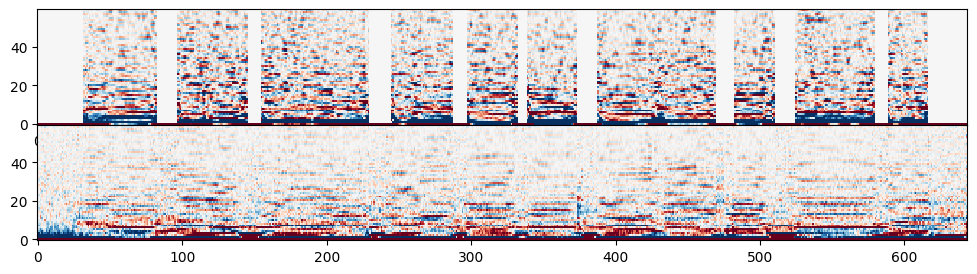

In [8]:
# plot acoustic features (compressed as mel-generalized cepstrum)
xMH = vocv1no.sp2mgc(xH, fs)
xMN = vocv1no.sp2mgc(xN, fs)
print(f'{xMH.shape = }')
print(f'{xMN.shape = }')

_ = plt.figure(figsize=(12, 3))
_ = plt.subplots_adjust(hspace=0)
_ = plt.subplot(2, 1, 1)
_ = plt.imshow(xMH.T, 'RdBu', origin='lower', aspect='auto', interpolation='nearest', vmin=-10, vmax=10)
_ = plt.subplot(2, 1, 2)
_ = plt.imshow(xMN.T, 'RdBu', origin='lower', aspect='auto', interpolation='nearest', vmin=-10, vmax=10)


yH.shape = (644, 1025)
yN.shape = (644, 442)


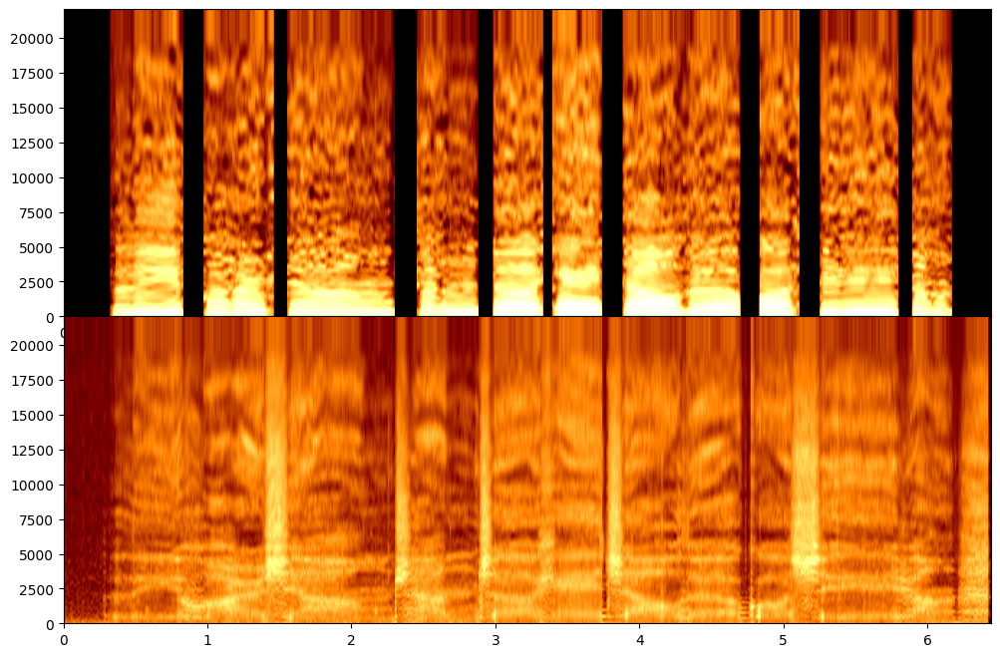

In [9]:
# plot acoustic features (reconstructed)
yH = vocv1no.mgc2sp(xMH, fs, vocv1.fftSize)
yN = vocv1no.mgc2sp(xMN, fs, vocv1.hopSamples * 2)
print(f'{yH.shape = }')
print(f'{yN.shape = }')

_ = plt.figure(figsize=(12, 8))
_ = plt.subplots_adjust(hspace=0)
_ = plt.subplot(2, 1, 1)
_ = plt.imshow(np.log(np.maximum(yH, 1e-5))[:, :-1].T, 'afmhot', origin='lower', aspect='auto', vmin=-10, vmax=5, extent=specViewport)
_ = plt.subplot(2, 1, 2)
_ = plt.imshow(np.log(np.maximum(yN, 1e-5))[:, :-1].T, 'afmhot', origin='lower', aspect='auto', vmin=-10, vmax=5, extent=specViewport)


# Synthesis with NumPy

In [10]:
synthesizer = vocv1no.Synthesizer(vocv1no.hopSize, vocv1no.targetFs)


In [11]:
# resynthesize audio (with white noise as breathiness excitation)

y0h = synthesizer.synthHm(f0, xH)
y0n = synthesizer.synthBrRandom(xN)
y0 = y0h + y0n

y1h = synthesizer.synthHm(f0, yH)
y1n = synthesizer.synthBrRandom(yN)
y1 = y1h + y1n

ipd.display(
    ipd.Markdown('## Original audio'),
    ipd.Audio(x, rate=fs),
    ipd.Markdown('## Reconstructed audio, white noise, linear features'),
    ipd.Audio(y0, rate=fs),
    ipd.Markdown('## Reconstructed audio, white noise, MGC restored features'),
    ipd.Audio(y1, rate=fs),
)

## Original audio

## Reconstructed audio, white noise, linear features

## Reconstructed audio, white noise, MGC restored features

# Synthesis with PyTorch

In [12]:
synthesizer = vocv1pt.Synthesizer(vocv1no.hopSize, vocv1no.targetFs)

f0 = torch.from_numpy(f0).float()
xH = torch.from_numpy(xH).float()
xN = torch.from_numpy(xN).float()
yH = torch.from_numpy(yH).float()
yN = torch.from_numpy(yN).float()

In [13]:
# resynthesize audio (with white noise as breathiness excitation)

y0h = synthesizer.synthHm(f0, xH)
y0n = synthesizer.synthBrRandom(xN)
y0 = y0h + y0n

y1h = synthesizer.synthHm(f0, yH)
y1n = synthesizer.synthBrRandom(yN)
y1 = y1h + y1n

ipd.display(
    ipd.Markdown('## Original audio'),
    ipd.Audio(x, rate=fs),
    ipd.Markdown('## Reconstructed audio, white noise, linear features'),
    ipd.Audio(y0, rate=fs),
    ipd.Markdown('## Reconstructed audio, white noise, MGC restored features'),
    ipd.Audio(y1, rate=fs),
)

## Original audio

## Reconstructed audio, white noise, linear features

## Reconstructed audio, white noise, MGC restored features

In [18]:
xN, y0h

(tensor([[4.5512e-02, 3.6352e-02, 2.0204e-02,  ..., 8.4169e-04, 1.0987e-03,
          1.2227e-03],
         [1.8054e-01, 1.4921e-01, 9.2475e-02,  ..., 8.4796e-04, 5.9948e-04,
          5.1947e-04],
         [3.3079e-02, 3.1593e-02, 2.8798e-02,  ..., 5.7782e-04, 5.0534e-04,
          4.8083e-04],
         ...,
         [1.8621e-01, 2.1381e-01, 2.8831e-01,  ..., 1.6737e-02, 1.9781e-02,
          2.0916e-02],
         [4.7079e-03, 4.3046e-03, 3.4696e-03,  ..., 2.1397e-03, 2.0950e-03,
          2.0679e-03],
         [6.0389e-05, 4.8282e-05, 2.8779e-05,  ..., 3.2902e-05, 2.9560e-05,
          2.8561e-05]]),
 tensor([0., 0., 0.,  ..., 0., 0., 0.]))

In [14]:
# resynthesize audio (with white noise as breathiness excitation)

y0h = synthesizer.synthHm(f0, xH)
y0n = synthesizer.synthBrNeural(xN, y0h)
y0 = y0h + y0n

y1h = synthesizer.synthHm(f0, yH)
y1n = synthesizer.synthBrNeural(yN, y1h)
y1 = y1h + y1n

ipd.display(
    ipd.Markdown('## Original audio'),
    ipd.Audio(x, rate=fs),
    ipd.Markdown('## Reconstructed audio, neural breathiness, linear features'),
    ipd.Audio(y0, rate=fs),
    ipd.Markdown('## Reconstructed audio, neural breathiness, MGC restored features'),
    ipd.Audio(y1, rate=fs),
)

## Original audio

## Reconstructed audio, neural breathiness, linear features

## Reconstructed audio, neural breathiness, MGC restored features